In [1]:
import os
import sys
import numpy as np
from matplotlib import pyplot as plt

In [2]:


def readNEXUS(densityFile,gridsize,vel=False,velFile=None):
    #This function will read the files generated by runNEXUS and make them into numpy arrays
    #It can also read DTFE velocity files as an extra option
    #The order is as follows, it returns:
    #Densityfield, NEXUS_nodes, NEXUS_filaments, NEXUS_walls, Velocity (optional)
    #The NEXUS arrays can then be used for contours or converted into boolean arrays
    #Where all cells > 0 are part of the corresponding structure
    #Voids are located where the other three components are all 0 
    shape = (gridsize,gridsize,gridsize)
    denfield = np.fromfile(densityFile,dtype=np.float32)
    denfield = np.reshape(denfield[262:-2],shape)
    MMFn = np.fromfile("node_clean.MMF",dtype=np.int16)
    MMFn = np.reshape(MMFn[527:-1],shape)
    MMFf = np.fromfile("fila_clean.MMF",dtype=np.int16)
    MMFf = np.reshape(MMFf[527:-1],shape)
    MMFw = np.fromfile("wall_clean.MMF",dtype=np.int16)
    MMFw = np.reshape(MMFw[527:-1],shape)
    #Correct for the z-axis missallignment of the density field wrt NEXUS
    def maxmean(densf,MMFfila,axisn,ran):
        k = np.zeros(ran)
        for i in range(ran):
            k[i] = np.mean(np.roll(densf,i,axis=axisn)[MMFfila>0])
        return np.argmax(k)
    
    shift = maxmean(denfield,MMFf,2,gridsize)
    denfield = np.roll(denfield,shift,axis=2)
    if vel==True:
        velo = np.fromfile(velFile,dtype=np.float32)
        k = np.reshape(velo,(gridsize,gridsize,gridsize,3))
        k = np.roll(k,shift,axis=2)
        return denfield, MMFn, MMFf, MMFw, k
    else:
        return denfield, MMFn, MMFf, MMFw
    


In [3]:
ProjDir = "/Users/users/spirov/ThesisProject"

binDir = ProjDir + "/Nexus/NEXUS_1.0/bin"

def NexusWork(nam,mini=0,maxi=5):

    densityFile = ProjDir + f"/Data/Densities/{name}.dat" 
    minscale = mini
    maxscale = maxi

    nexus_response_1 = '{0}/MMF_response {1} {2}-{3} --den --node node'.format( binDir, densityFile,0,maxscale )
    nexus_threshold_1 = '{0}/MMF_threshold node_maxResponse.MMF node.threshold --node --cleanFile node_clean.MMF --densityFile {1}'.format( binDir, densityFile )
    nexus_response_2 = '{0}/MMF_response {1} {2}-{3} --logFilter --fila fila --wall wall'.format( binDir, densityFile,minscale,maxscale )
    nexus_threshold_2 = '{0}/MMF_threshold fila_maxResponse.MMF fila.threshold --fila --cleanFile fila_clean.MMF --densityFile {1} --nodeFile node_clean.MMF'.format( binDir, densityFile )
    nexus_threshold_3 = '{0}/MMF_threshold wall_maxResponse.MMF wall.threshold --wall --cleanFile wall_clean.MMF --densityFile {1} --nodeFile node_clean.MMF --filaFile fila_clean.MMF '.format( binDir, densityFile )
    nexus_combine = '{0}/MMF_combine.py node_clean.MMF fila_clean.MMF wall_clean.MMF all_clean.MMF'.format( binDir )
    commands = [nexus_response_1,
                nexus_threshold_1,
                nexus_response_2,
                nexus_threshold_2,
                nexus_threshold_3,
                nexus_combine]

    for i in range(len(commands)):    #loop over all parts
        print("\tRunning part %i of %i parts ..." % (i+1,len(commands)))

        toRun = commands[i]
        #print("\nRUNNING:\n\t%s\n" % toRun)

        status = os.system( toRun )
        if status != 0: # an error took place
            sys.exit(1)


n = 256

# Physical

In [4]:
name = "PhysicalSpace"
NexusWork(name,mini=5,maxi=10)

	Running part 1 of 6 parts ...
RUNNING:   /Users/users/spirov/ThesisProject/Nexus/NEXUS_1.0/bin/MMF_response /Users/users/spirov/ThesisProject/Data/Densities/PhysicalSpace.dat 0-10 --den --node node 

The program will compute the MMF response for a set of scales using the following input parameters:
	 input data file             : /Users/users/spirov/ThesisProject/Data/Densities/PhysicalSpace.dat
	 scales                      : 0-10
	 node environment info       :   output file : node    and filter : 40
	 radius in Mpc               : 0.5
	 base                        : 1.41421
	 NO mask will be applied for the computation.
	 computing the response using the density field.
	 outputting to file: 1= maximum response for over all scales.

The program will use the following scales to compute the response:
	scale 	filter radius (Mpc)
	0	0.5
	1	0.707107
	2	1
	3	1.41421
	4	2
	5	2.82843
	6	4
	7	5.65685
	8	8
	9	11.3137
	10	16


Reading the header of the density file '/Users/users/spirov/ThesisP

Reading the data in the binary density file '/Users/users/spirov/ThesisProject/Data/Densities/PhysicalSpace.dat' ... Done.

Computations for scale: 5
Computing a 3D FFTW of size 256 * 256 * 256 ... Done!
Computing a 3D FFTW of size 256 * 256 * 256 ... Done!
Computing the entries of the Hessian matrix ... Done.
	 <<< 'hessian': user time = 3 sec. and CPU time = 3.17 sec.
Computing the eigenvalues and eigenvectors of the Hessian matrix ... Done.
	 <<< 'eigenvalues': user time = 1 sec. and CPU time = 1.19 sec.
Computing the filament response function using filter 30 ... Done.
Computing the wall response function using filter 20 ... Done.

Computations for scale: 6
Computing a 3D FFTW of size 256 * 256 * 256 ... Done!
Computing a 3D FFTW of size 256 * 256 * 256 ... Done!
Computing the entries of the Hessian matrix ... Done.
	 <<< 'hessian': user time = 3 sec. and CPU time = 3.23 sec.
Computing the eigenvalues and eigenvectors of the Hessian matrix ... Done.
	 <<< 'eigenvalues': user time =

      1 / 50		1.3e+04		1e+02		0
     11 / 50		1.3e+03		  21		-0.024
     21 / 50		1.2e+02		  85		-37
     31 / 50		  12		1e+02		-0.52
     41 / 50		 1.2		1e+02		-0.017
     50 / 50		0.15		1e+02		-0.025

Optimal threshold value: 151.1
Writting the results to the ASCII file 'wall.threshold' ... Done.
Computing the clean response using optimal threshold =151.1 and discarding objects with volumes smaller than 10 ... Done.
	Found 1100 objects with volumes larger than 10
Writing the clean MMF response to the binary MMF file 'wall_clean.MMF' ...  Done.
	Running part 6 of 6 parts ...
Reading the data in the MMF file 'wall_clean.MMF' which is file 1 of 1 files ... 
Reading the data in the MMF file 'fila_clean.MMF' which is file 1 of 1 files ... 
Reading the data in the MMF file 'node_clean.MMF' which is file 1 of 1 files ... 


In [5]:


tempfile = f"../{name}.dat"

denfield, MMFn, MMFf, MMFw = readNEXUS(tempfile,n,vel=False,velFile=None)

physicalPackage = (denfield,MMFn,MMFf,MMFw)

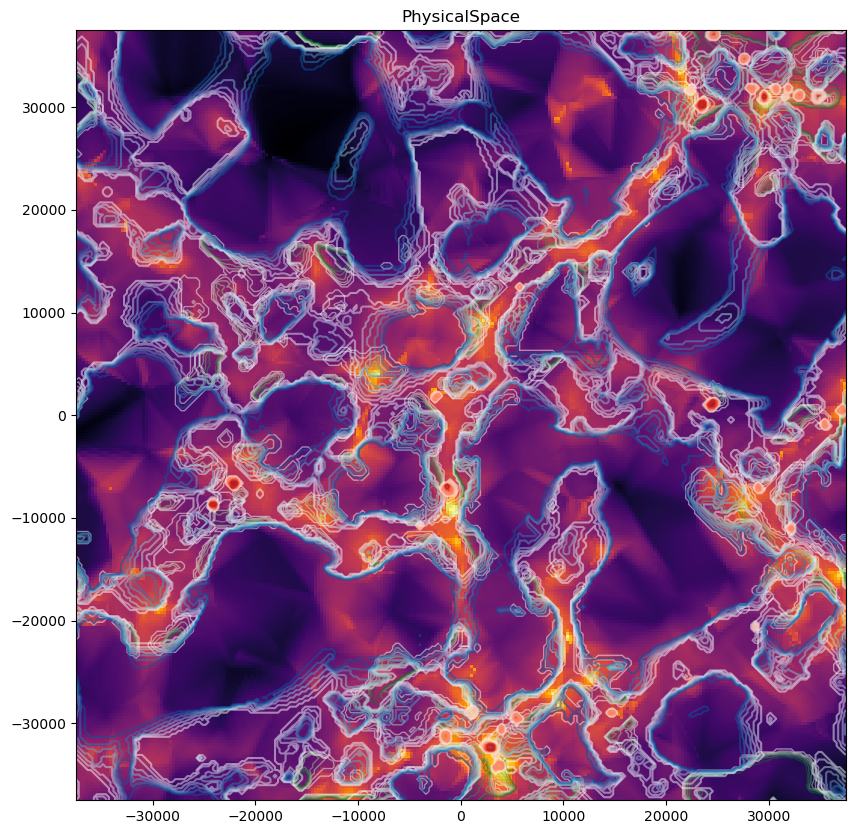

In [6]:
i = int(n/2)

L = 75000

l = 5
xf = -1
yf=1

x,y = np.meshgrid(np.linspace(-L/2,L/2,n),np.linspace(-L/2,L/2,n))

#Plotting
#x, y = np.meshgrid(np.linspace(0,300,n),np.linspace(0,300,n))
fig = plt.figure(figsize=(10,10))
im = plt.imshow(denfield[:,::yf,i-l:i+l].sum(2),norm="log",cmap="inferno",extent=[-L/2,L/2,-L/2,L/2])
plt.contour(x,y,MMFw[::xf,:,i-l:i+l].sum(2),cmap="Greens",linewidths=1,alpha=0.5)
plt.contour(x,y,MMFf[::xf,::1,i-l:i+l].sum(2),cmap="Blues",linewidths=1.5,alpha=0.5)
plt.contour(x,y,MMFn[::xf,::yf,i-l:i+l].sum(2),cmap="Reds",linewidths=3,alpha=0.5)
plt.title(name)
plt.savefig(name)
plt.show()

	Running part 1 of 6 parts ...
RUNNING:   /Users/users/spirov/ThesisProject/Nexus/NEXUS_1.0/bin/MMF_response /Users/users/spirov/ThesisProject/Data/Densities/RedshiftSpace.dat 0-10 --den --node node 

The program will compute the MMF response for a set of scales using the following input parameters:
	 input data file             : /Users/users/spirov/ThesisProject/Data/Densities/RedshiftSpace.dat
	 scales                      : 0-10
	 node environment info       :   output file : node    and filter : 40
	 radius in Mpc               : 0.5
	 base                        : 1.41421
	 NO mask will be applied for the computation.
	 computing the response using the density field.
	 outputting to file: 1= maximum response for over all scales.

The program will use the following scales to compute the response:
	scale 	filter radius (Mpc)
	0	0.5
	1	0.707107
	2	1
	3	1.41421
	4	2
	5	2.82843
	6	4
	7	5.65685
	8	8
	9	11.3137
	10	16


Reading the header of the density file '/Users/users/spirov/ThesisP

Reading the data in the binary density file '/Users/users/spirov/ThesisProject/Data/Densities/RedshiftSpace.dat' ... Done.

Computations for scale: 5
Computing a 3D FFTW of size 256 * 256 * 256 ... Done!
Computing a 3D FFTW of size 256 * 256 * 256 ... Done!
Computing the entries of the Hessian matrix ... Done.
	 <<< 'hessian': user time = 3 sec. and CPU time = 3.38 sec.
Computing the eigenvalues and eigenvectors of the Hessian matrix ... Done.
	 <<< 'eigenvalues': user time = 2 sec. and CPU time = 1.23 sec.
Computing the filament response function using filter 30 ... Done.
Computing the wall response function using filter 20 ... Done.

Computations for scale: 6
Computing a 3D FFTW of size 256 * 256 * 256 ... Done!
Computing a 3D FFTW of size 256 * 256 * 256 ... Done!
Computing the entries of the Hessian matrix ... Done.
	 <<< 'hessian': user time = 4 sec. and CPU time = 3.19 sec.
Computing the eigenvalues and eigenvectors of the Hessian matrix ... Done.
	 <<< 'eigenvalues': user time =

      1 / 50		9.9e+02		1e+02		0
     11 / 50		  97		  42		0.11
     21 / 50		 9.4		  94		-2
     31 / 50		0.92		1e+02		0.068
     41 / 50		0.089		1e+02		0.0088
     50 / 50		0.011		1e+02		0.00055

Optimal threshold value: 15.6
Writting the results to the ASCII file 'wall.threshold' ... Done.
Computing the clean response using optimal threshold =15.6 and discarding objects with volumes smaller than 10 ... Done.
	Found 840 objects with volumes larger than 10
Writing the clean MMF response to the binary MMF file 'wall_clean.MMF' ...  Done.
	Running part 6 of 6 parts ...
Reading the data in the MMF file 'wall_clean.MMF' which is file 1 of 1 files ... 
Reading the data in the MMF file 'fila_clean.MMF' which is file 1 of 1 files ... 
Reading the data in the MMF file 'node_clean.MMF' which is file 1 of 1 files ... 


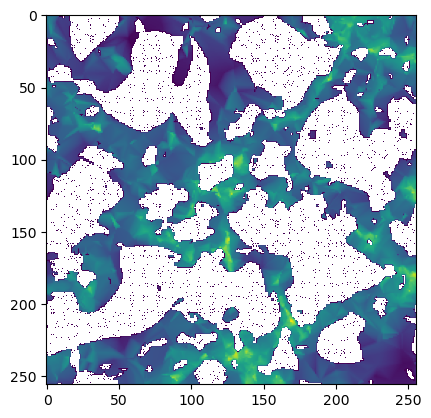

In [7]:
name = "RedshiftSpace"
NexusWork(name,mini=5,maxi=10)

tempfile = f"../{name}.dat"

denfield, MMFn, MMFf, MMFw = readNEXUS(tempfile,n,vel=False,velFile=None)
redshiftPackage = (denfield,MMFn,MMFf,MMFw)

mask =1-MMFf[:,:,i]
plt.imshow(mask*denfield[:,:,i],norm='log')


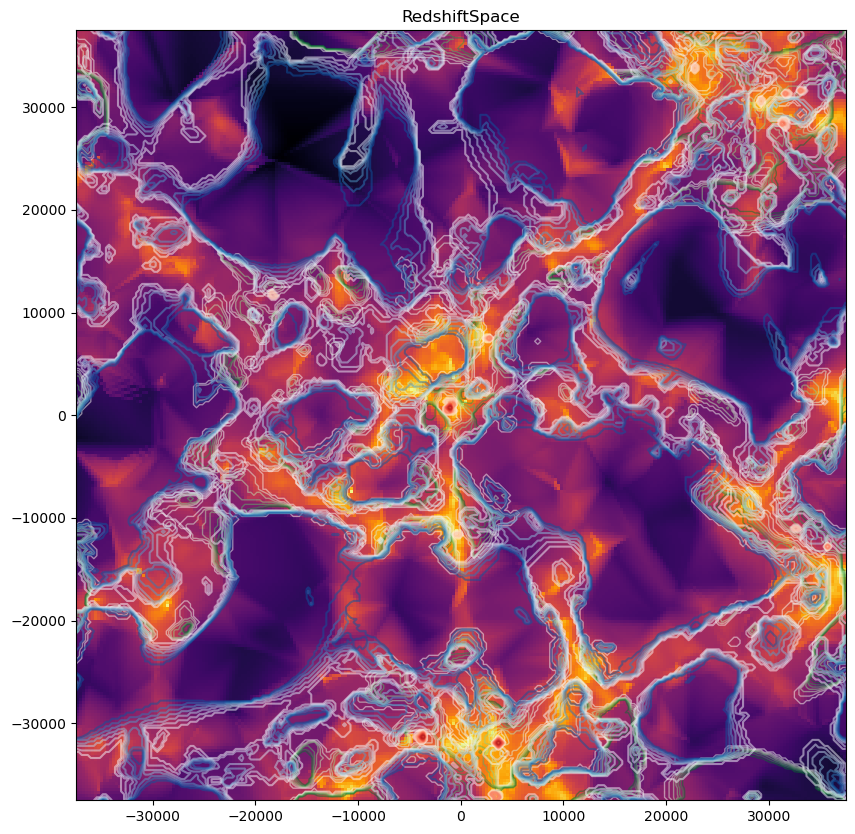

In [8]:
#Plotting
#x, y = np.meshgrid(np.linspace(0,300,n),np.linspace(0,300,n))
fig = plt.figure(figsize=(10,10))
im = plt.imshow(denfield[:,::yf,i-l:i+l].sum(2),norm="log",cmap="inferno",extent=[-L/2,L/2,-L/2,L/2])
plt.contour(x,y,MMFw[::xf,:,i-l:i+l].sum(2),cmap="Greens",linewidths=1,alpha=0.5)
plt.contour(x,y,MMFf[::xf,::1,i-l:i+l].sum(2),cmap="Blues",linewidths=1.5,alpha=0.5)
plt.contour(x,y,MMFn[::xf,::yf,i-l:i+l].sum(2),cmap="Reds",linewidths=3,alpha=0.5)
plt.title(name)
plt.savefig(name)
plt.show()

	Running part 1 of 6 parts ...
RUNNING:   /Users/users/spirov/ThesisProject/Nexus/NEXUS_1.0/bin/MMF_response /Users/users/spirov/ThesisProject/Data/Densities/ModelSpace.dat 0-10 --den --node node 

The program will compute the MMF response for a set of scales using the following input parameters:
	 input data file             : /Users/users/spirov/ThesisProject/Data/Densities/ModelSpace.dat
	 scales                      : 0-10
	 node environment info       :   output file : node    and filter : 40
	 radius in Mpc               : 0.5
	 base                        : 1.41421
	 NO mask will be applied for the computation.
	 computing the response using the density field.
	 outputting to file: 1= maximum response for over all scales.

The program will use the following scales to compute the response:
	scale 	filter radius (Mpc)
	0	0.5
	1	0.707107
	2	1
	3	1.41421
	4	2
	5	2.82843
	6	4
	7	5.65685
	8	8
	9	11.3137
	10	16


Reading the header of the density file '/Users/users/spirov/ThesisProject

Reading the data in the binary density file '/Users/users/spirov/ThesisProject/Data/Densities/ModelSpace.dat' ... Done.

Computations for scale: 5
Computing a 3D FFTW of size 256 * 256 * 256 ... Done!
Computing a 3D FFTW of size 256 * 256 * 256 ... Done!
Computing the entries of the Hessian matrix ... Done.
	 <<< 'hessian': user time = 3 sec. and CPU time = 3.21 sec.
Computing the eigenvalues and eigenvectors of the Hessian matrix ... Done.
	 <<< 'eigenvalues': user time = 1 sec. and CPU time = 1.26 sec.
Computing the filament response function using filter 30 ... Done.
Computing the wall response function using filter 20 ... Done.

Computations for scale: 6
Computing a 3D FFTW of size 256 * 256 * 256 ... Done!
Computing a 3D FFTW of size 256 * 256 * 256 ... Done!
Computing the entries of the Hessian matrix ... Done.
	 <<< 'hessian': user time = 3 sec. and CPU time = 3.23 sec.
Computing the eigenvalues and eigenvectors of the Hessian matrix ... Done.
	 <<< 'eigenvalues': user time = 2 

      1 / 50		4.1e+04		1e+02		0
     11 / 50		4e+03		  42		-3.2
     21 / 50		3.9e+02		  90		-79
     31 / 50		  38		1e+02		1.5
     41 / 50		 3.7		1e+02		0.16
     50 / 50		0.45		1e+02		0.01

Optimal threshold value: 418.7
Writting the results to the ASCII file 'wall.threshold' ... Done.
Computing the clean response using optimal threshold =418.7 and discarding objects with volumes smaller than 10 ... Done.
	Found 822 objects with volumes larger than 10
Writing the clean MMF response to the binary MMF file 'wall_clean.MMF' ...  Done.
	Running part 6 of 6 parts ...
Reading the data in the MMF file 'wall_clean.MMF' which is file 1 of 1 files ... 
Reading the data in the MMF file 'fila_clean.MMF' which is file 1 of 1 files ... 
Reading the data in the MMF file 'node_clean.MMF' which is file 1 of 1 files ... 


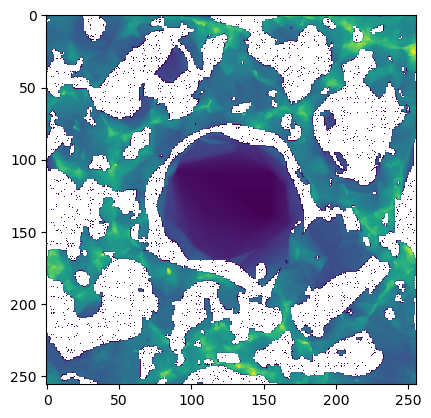

In [9]:
name = "ModelSpace"
NexusWork(name,mini=5,maxi=10)

tempfile = f"../{name}.dat"

denfield, MMFn, MMFf, MMFw = readNEXUS(tempfile,n,vel=False,velFile=None)
modelPackage = (denfield,MMFn,MMFf,MMFw)

mask =1-MMFf[:,:,i]
plt.imshow(mask*denfield[:,:,i],norm='log')


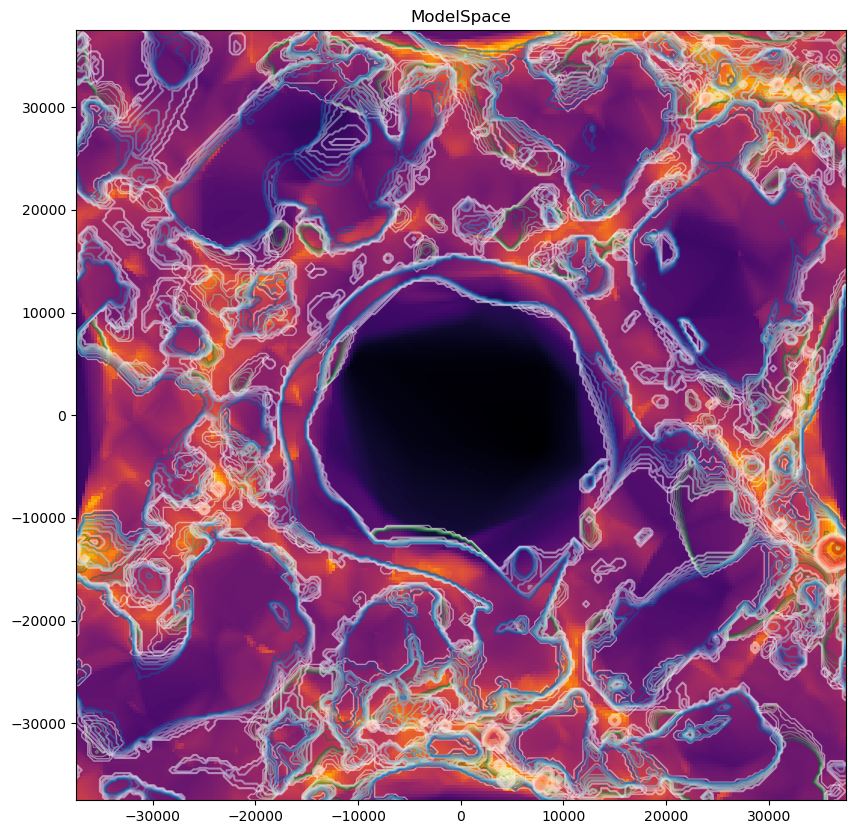

In [10]:
#Plotting
#x, y = np.meshgrid(np.linspace(0,300,n),np.linspace(0,300,n))
fig = plt.figure(figsize=(10,10))
im = plt.imshow(denfield[:,::yf,i-l:i+l].sum(2),norm="log",cmap="inferno",extent=[-L/2,L/2,-L/2,L/2])
plt.contour(x,y,MMFw[::xf,:,i-l:i+l].sum(2),cmap="Greens",linewidths=1,alpha=0.5)
plt.contour(x,y,MMFf[::xf,::1,i-l:i+l].sum(2),cmap="Blues",linewidths=1.5,alpha=0.5)
plt.contour(x,y,MMFn[::xf,::yf,i-l:i+l].sum(2),cmap="Reds",linewidths=3,alpha=0.5)
plt.title(name)
plt.savefig(name)
plt.show()

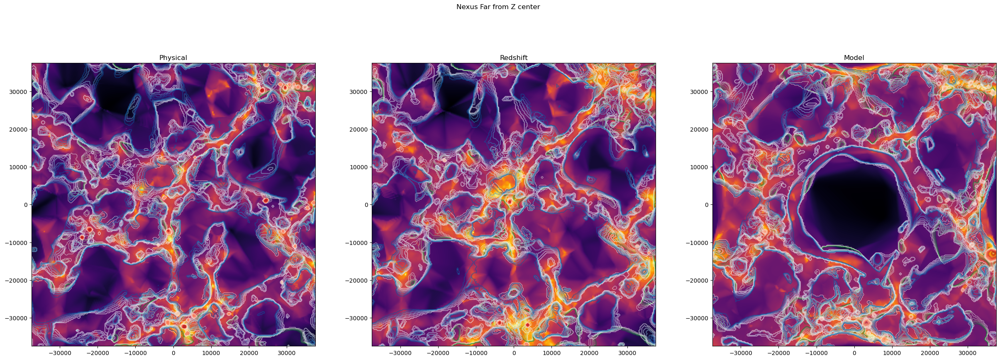

In [11]:
fig = plt.figure(figsize=(30,10))

i = 128

xf=-1

plt.subplot(131)

plt.imshow(physicalPackage[0][:,:,i-l:i+l].sum(2),norm="log",cmap="inferno",extent=[-L/2,L/2,-L/2,L/2])
plt.contour(x,y,physicalPackage[3][::xf,:,i-l:i+l].sum(2),cmap="Greens",linewidths=1,alpha=0.5)
plt.contour(x,y,physicalPackage[2][::xf,::1,i-l:i+l].sum(2),cmap="Blues",linewidths=1.5,alpha=0.5)
plt.contour(x,y,physicalPackage[1][::xf,::yf,i-l:i+l].sum(2),cmap="Reds",linewidths=3,alpha=0.5)
plt.title("Physical")

plt.subplot(132)

plt.imshow(redshiftPackage[0][:,:,i-l:i+l].sum(2),norm="log",cmap="inferno",extent=[-L/2,L/2,-L/2,L/2])
plt.contour(x,y,redshiftPackage[3][::xf,:,i-l:i+l].sum(2),cmap="Greens",linewidths=1,alpha=0.5)
plt.contour(x,y,redshiftPackage[2][::xf,::1,i-l:i+l].sum(2),cmap="Blues",linewidths=1.5,alpha=0.5)
plt.contour(x,y,redshiftPackage[1][::xf,::yf,i-l:i+l].sum(2),cmap="Reds",linewidths=3,alpha=0.5)
plt.title("Redshift")
plt.subplot(133)

plt.imshow(modelPackage[0][:,:,i-l:i+l].sum(2),norm="log",cmap="inferno",extent=[-L/2,L/2,-L/2,L/2])
plt.contour(x,y,modelPackage[3][::xf,:,i-l:i+l].sum(2),cmap="Greens",linewidths=1,alpha=0.5)
plt.contour(x,y,modelPackage[2][::xf,::1,i-l:i+l].sum(2),cmap="Blues",linewidths=1.5,alpha=0.5)
plt.contour(x,y,modelPackage[1][::xf,::yf,i-l:i+l].sum(2),cmap="Reds",linewidths=3,alpha=0.5)
plt.title("Model")

plt.suptitle("Nexus Far from Z center")
plt.show()

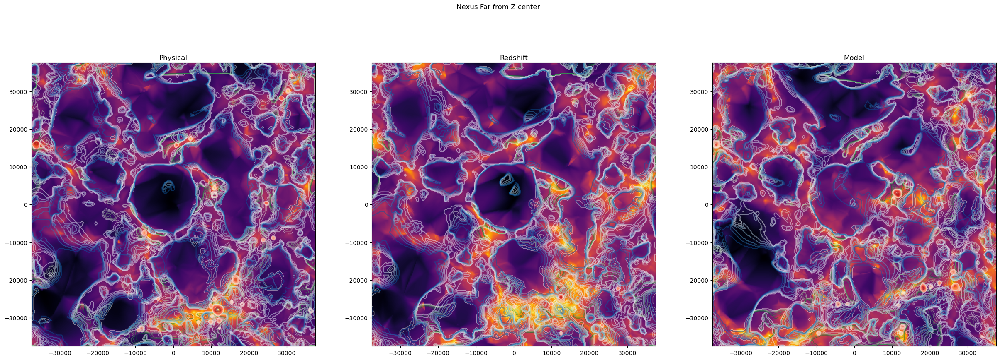

In [12]:
fig = plt.figure(figsize=(30,10))

i=50

xf=-1

plt.subplot(131)

plt.imshow(physicalPackage[0][:,:,i-l:i+l].sum(2),norm="log",cmap="inferno",extent=[-L/2,L/2,-L/2,L/2])
plt.contour(x,y,physicalPackage[3][::xf,:,i-l:i+l].sum(2),cmap="Greens",linewidths=1,alpha=0.5)
plt.contour(x,y,physicalPackage[2][::xf,::1,i-l:i+l].sum(2),cmap="Blues",linewidths=1.5,alpha=0.5)
plt.contour(x,y,physicalPackage[1][::xf,::yf,i-l:i+l].sum(2),cmap="Reds",linewidths=3,alpha=0.5)
plt.title("Physical")

plt.subplot(132)

plt.imshow(redshiftPackage[0][:,:,i-l:i+l].sum(2),norm="log",cmap="inferno",extent=[-L/2,L/2,-L/2,L/2])
plt.contour(x,y,redshiftPackage[3][::xf,:,i-l:i+l].sum(2),cmap="Greens",linewidths=1,alpha=0.5)
plt.contour(x,y,redshiftPackage[2][::xf,::1,i-l:i+l].sum(2),cmap="Blues",linewidths=1.5,alpha=0.5)
plt.contour(x,y,redshiftPackage[1][::xf,::yf,i-l:i+l].sum(2),cmap="Reds",linewidths=3,alpha=0.5)
plt.title("Redshift")
plt.subplot(133)

plt.imshow(modelPackage[0][:,:,i-l:i+l].sum(2),norm="log",cmap="inferno",extent=[-L/2,L/2,-L/2,L/2])
plt.contour(x,y,modelPackage[3][::xf,:,i-l:i+l].sum(2),cmap="Greens",linewidths=1,alpha=0.5)
plt.contour(x,y,modelPackage[2][::xf,::1,i-l:i+l].sum(2),cmap="Blues",linewidths=1.5,alpha=0.5)
plt.contour(x,y,modelPackage[1][::xf,::yf,i-l:i+l].sum(2),cmap="Reds",linewidths=3,alpha=0.5)
plt.title("Model")

plt.suptitle("Nexus Far from Z center")
plt.show()

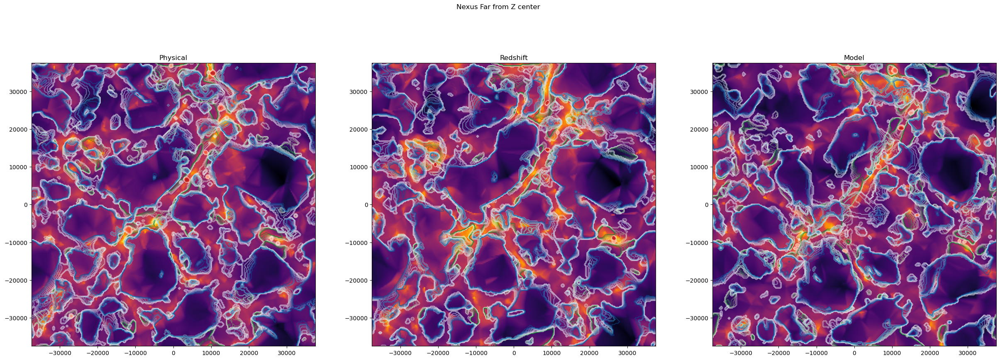

In [13]:
fig = plt.figure(figsize=(30,10))

i=180
l=3

xf=-1

plt.subplot(131)

plt.imshow(physicalPackage[0][:,:,i-l:i+l].sum(2),norm="log",cmap="inferno",extent=[-L/2,L/2,-L/2,L/2])
plt.contour(x,y,physicalPackage[3][::xf,:,i-l:i+l].sum(2),cmap="Greens",linewidths=1,alpha=0.5)
plt.contour(x,y,physicalPackage[2][::xf,::1,i-l:i+l].sum(2),cmap="Blues",linewidths=1.5,alpha=0.5)
plt.contour(x,y,physicalPackage[1][::xf,::yf,i-l:i+l].sum(2),cmap="Reds",linewidths=3,alpha=0.5)
plt.title("Physical")

plt.subplot(132)

plt.imshow(redshiftPackage[0][:,:,i-l:i+l].sum(2),norm="log",cmap="inferno",extent=[-L/2,L/2,-L/2,L/2])
plt.contour(x,y,redshiftPackage[3][::xf,:,i-l:i+l].sum(2),cmap="Greens",linewidths=1,alpha=0.5)
plt.contour(x,y,redshiftPackage[2][::xf,::1,i-l:i+l].sum(2),cmap="Blues",linewidths=1.5,alpha=0.5)
plt.contour(x,y,redshiftPackage[1][::xf,::yf,i-l:i+l].sum(2),cmap="Reds",linewidths=3,alpha=0.5)
plt.title("Redshift")
plt.subplot(133)

plt.imshow(modelPackage[0][:,:,i-l:i+l].sum(2),norm="log",cmap="inferno",extent=[-L/2,L/2,-L/2,L/2])
plt.contour(x,y,modelPackage[3][::xf,:,i-l:i+l].sum(2),cmap="Greens",linewidths=1,alpha=0.5)
plt.contour(x,y,modelPackage[2][::xf,::1,i-l:i+l].sum(2),cmap="Blues",linewidths=1.5,alpha=0.5)
plt.contour(x,y,modelPackage[1][::xf,::yf,i-l:i+l].sum(2),cmap="Reds",linewidths=3,alpha=0.5)
plt.title("Model")

plt.suptitle("Nexus Far from Z center")
plt.show()

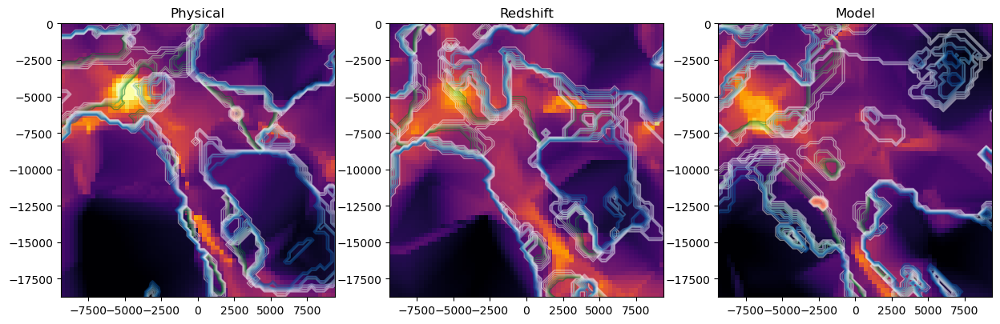

In [21]:
plt.figure(figsize=(15,5))

vmin = 1
vmax = 1e3
l=2

plt.subplot(131)
plt.imshow(physicalPackage[0][:,:,i-l:i+l].sum(2),norm="log",cmap="inferno",extent=[-L/2,L/2,-L/2,L/2],vmin=vmin,vmax=vmax)
plt.contour(x,y,physicalPackage[3][::xf,:,i-l:i+l].sum(2),cmap="Greens",linewidths=1,alpha=0.5)
plt.contour(x,y,physicalPackage[2][::xf,::1,i-l:i+l].sum(2),cmap="Blues",linewidths=1.5,alpha=0.5)
plt.contour(x,y,physicalPackage[1][::xf,::yf,i-l:i+l].sum(2),cmap="Reds",linewidths=3,alpha=0.5)
plt.xlim(-L/8,L/8)
plt.ylim(-L/4,0)

plt.title("Physical")
plt.subplot(132)
plt.imshow(redshiftPackage[0][:,:,i-l:i+l].sum(2),norm="log",cmap="inferno",extent=[-L/2,L/2,-L/2,L/2],vmin=vmin,vmax=vmax)
plt.contour(x,y,redshiftPackage[3][::xf,:,i-l:i+l].sum(2),cmap="Greens",linewidths=1,alpha=0.5)
plt.contour(x,y,redshiftPackage[2][::xf,::1,i-l:i+l].sum(2),cmap="Blues",linewidths=1.5,alpha=0.5)
plt.contour(x,y,redshiftPackage[1][::xf,::yf,i-l:i+l].sum(2),cmap="Reds",linewidths=3,alpha=0.5)
plt.xlim(-L/8,L/8)
plt.ylim(-L/4,0)

plt.title("Redshift")
plt.subplot(133)
plt.imshow(modelPackage[0][:,:,i-l:i+l].sum(2),norm="log",cmap="inferno",extent=[-L/2,L/2,-L/2,L/2],vmin=vmin,vmax=vmax)
plt.contour(x,y,modelPackage[3][::xf,:,i-l:i+l].sum(2),cmap="Greens",linewidths=1,alpha=0.5)
plt.contour(x,y,modelPackage[2][::xf,::1,i-l:i+l].sum(2),cmap="Blues",linewidths=1.5,alpha=0.5)
plt.contour(x,y,modelPackage[1][::xf,::yf,i-l:i+l].sum(2),cmap="Reds",linewidths=3,alpha=0.5)
plt.xlim(-L/8,L/8)
plt.ylim(-L/4,0)
plt.title("Model")

plt.suptitle("")


plt.show()
